<div align="center">
    
# Austin Electricity Vehicle Charging Station Accessibility Analysis

</div>


<div align="center">
    
#### Zhuopei Jin
#### ZJ3276
##### Python for Geoscience Research 
##### Instructor: Toti Larson toti.Larson@beg.utexas.edu
    

            
</div>

### 1. Project Topic

A report by McKinsey and Company found that over 12 million electric vehicle charging stations will be required
throughout the United States by 2030. While the demand for electric vehicles has been growing rapidly, the technology is
mostly owned by households with high incomes Given the benefits of EVs, and the need for widespread adoption in order
to reduce the transportation sector’s reliance on fossil fuels, it is important to make this technology accessible to low
income and disadvantaged households.

This study used Python accessibility modelling with r5py to determine the accessibility of EV charging stations in different
Census tracts throughout Austin Using a travel time matrix, accessibility values were found for each Census Travis.
Those values were then compared to the demographic features through a regression analysis.


### 2. Data Source

a. Austin Census Tract Shapefile 2022: 

https://www.census.gov/cgi-bin/geo/shapefiles/index.php?year=2022&layergroup=Census+Tracts

b. Department of Energy (EV Charging Stations)

https://www.google.com/maps/d/u/0/viewer?mid=1gvV35B2bXLd3wRIcMu2bwB5HjsQ9MLU&femb=1&ll=30.285348402416933%2C-97.71041759696104&z=10

c. American Community Survey 2018-2022(5-year estimate):

https://www.socialexplorer.com/explore-maps

### 3. Method

a. Import the geodataframe for Census Tracts, the addresses of EV Charging Stations, and the ACS 2018-2022 survey data.

b. Geocode the addresses of EV Charging Stations to obtain their longitude and latitude; display the centroid of each Census Tract; join the ACS 2018-2022 survey data to the Census Tract features.

c. Calculate a travel time matrix from all EV Charging Stations to each Census Tract centroid.

d. Merge the travel time data back into the Census Tract data and visualize the travel times for each Census Tract.

e. Conduct a linear regression analysis to explore the relationship between travel time to EV Charging Stations and demographic characteristics of the Census Tracts.


### 4. Code

Here's the library you need to install for runing this analysis

In [ ]:
!pip install shapely
!pip install osmnx
!pip install r5py
!pip install mapclassify
!pip install statsmodels
!pip install scikit-learn

In [1]:
import geopandas as gpd
from shapely.geometry import Point 
import pandas as pd
import osmnx as ox
import numpy as np
import r5py
import datetime
import json
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import mapclassify
import matplotlib.colors as mcolors
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

C:\Users\jinzh\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


### 4.1 Data Import and Cleanup

#### A. Import Austin Census Triact Shapefile
First, since the shapefile we downloaded covers Texas, we need to select the area around Austin. I plan to select the Bastrop, Caldwell, Hays, Travis, and Williamson counties as our study area first. (PS: You may see I reduce the study area at 3c)

In [2]:
#Open the shapefile of Census Tract for Texas
texas_path = 'CensusTractBoundary/tl_2022_48_tract.shp'
texas_gdf = gpd.read_file(texas_path)

In [3]:
texas_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6896 entries, 0 to 6895
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   6896 non-null   object  
 1   COUNTYFP  6896 non-null   object  
 2   TRACTCE   6896 non-null   object  
 3   GEOID     6896 non-null   object  
 4   NAME      6896 non-null   object  
 5   NAMELSAD  6896 non-null   object  
 6   MTFCC     6896 non-null   object  
 7   FUNCSTAT  6896 non-null   object  
 8   ALAND     6896 non-null   int64   
 9   AWATER    6896 non-null   int64   
 10  INTPTLAT  6896 non-null   object  
 11  INTPTLON  6896 non-null   object  
 12  geometry  6896 non-null   geometry
dtypes: geometry(1), int64(2), object(10)
memory usage: 700.5+ KB


In [4]:
texas_gdf.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,48,187,210707,48187210707,2107.07,Census Tract 2107.07,G5020,S,7684752,16960,+29.5796294,-098.2944795,"POLYGON ((-98.31206 29.59085, -98.31201 29.591..."
1,48,187,210709,48187210709,2107.09,Census Tract 2107.09,G5020,S,4399576,0,+29.5922662,-098.2812989,"POLYGON ((-98.29620 29.60001, -98.29618 29.600..."
2,48,187,210711,48187210711,2107.11,Census Tract 2107.11,G5020,S,3704218,0,+29.5990695,-098.2674716,"POLYGON ((-98.28035 29.60625, -98.28033 29.606..."
3,48,085,031673,48085031673,316.73,Census Tract 316.73,G5020,S,688650,0,+33.0629491,-096.7936306,"POLYGON ((-96.79633 33.06257, -96.79632 33.062..."
4,48,439,113809,48439113809,1138.09,Census Tract 1138.09,G5020,S,2475720,0,+32.8654907,-097.2526443,"POLYGON ((-97.26461 32.86064, -97.26460 32.860..."


In [5]:
# Select the 5 counties by using their COUNTYFP and save it into a new shp
fivecounties = ['491','453','209','021','055']
austin_ct = texas_gdf[texas_gdf['COUNTYFP'].isin(fivecounties)]
austin_ct.to_file('austin_area.shp')
austin_ct.shape

(503, 13)

In [6]:
#Check shapefile
austin_ct.explore()

#### B. Import Austin Electricity Charging Station CSV file
Since the file only includes the addresses of the charging stations instead of longitude and latitude, we have to geocode the locations of these stations.

In [7]:
#Import the Electricity Charging Station csv. file
ECS = pd.read_csv('Plug-In_EVerywhere_Charging_Station_Network_20240409.csv')
ECS.head()

,id,Station Name,Address_1,Address 2,City,State,Postal Code,No. of Ports,Pricing Policy,Usage Access,Category,Subcategory,Port 1: Connector Type,Voltage (V),Port 2: Connector Type,New Georeferenced Column,Pricing,Power Select
0,1,AISD / AKINS1,10701 S 1st St.,NaN,Austin,Texas,78748,2,NaN,All Drivers,Education,High School / Other,J1772,240V,J1772,"10701 S 1st St.\nAustin, Texas 3637\n(30.14878...",NaN,40A
1,2,AMD GO GREEN / P100 FL2 LEFT,7171 Southwest Pkwy,NaN,Austin,Texas,78735,2,NaN,AMD Lone Star,Workplace,High-Tech,J1772,240V,J1772,"7171 Southwest Pkwy\nAustin, Texas 3251\n(30.2...",NaN,40A
2,3,PIE AE / PUBACCHIGHLAND1,5930 Middle Fiskville Rd,NaN,Austin,Texas,78752,2,$4.17/month PIE members $2/hr Non-Members,All Drivers,Parking,Commercial,J1772,240V,J1772,"5930 Middle Fiskville Rd\nAustin, Texas 3641\n...",$4.17/month PIE members $2/hr Non-Members,40A
3,4,ACC / AE HLC GAR 1F7,6018 WILHELMINA DELCO DR,NaN,Austin,Texas,78752,2,NaN,All Drivers,Education,University / College,J1772,240V,J1772,"6018 WILHELMINA DELCO DR\nAustin, Texas 3641\n...",NaN,40A
4,5,RIATA' / WOODTRAIL,5700 Tapadera Trace Ln,NaN,Austin,Texas,78727,2,$4.17/month PIE members $2/hr Non-Members,All Drivers,Multi-family Commercial,Apartment,J1772,240V,J1772,"5700 Tapadera Trace Ln\nAustin, Texas 3243\n(3...",$4.17/month PIE members $2/hr Non-Members,40A


In [8]:
#Currently the address of charging stations are not accurate, add the city and state to each address
ECS = pd.DataFrame(ECS)
ECS['Address_1'] = ECS['Address_1'] + ', Austin, TX'
address = ECS['Address_1']
address

0               10701 S 1st St., Austin, TX
1           7171 Southwest Pkwy, Austin, TX
2      5930 Middle Fiskville Rd, Austin, TX
3      6018 WILHELMINA DELCO DR, Austin, TX
4        5700 Tapadera Trace Ln, Austin, TX
                       ...                 
675         611 Center Ridge Dr, Austin, TX
676     41 N Pleasant Valley Rd, Austin, TX
677    6310 Wilhelmina Delco Dr, Austin, TX
678            400 W St Elmo Rd, Austin, TX
679       7601 E Ben White Blvd, Austin, TX
Name: Address_1, Length: 680, dtype: object

In [9]:
#Geocode the address of ECS locations
def geocode_ecs(address):
    try:
        lat, lon = ox.geocode(address)
        return pd.Series([lat, lon])
    except Exception as e:
        print(f"Failed to geocode address'{address}':{e}")
        return pd.Series([None, None])

#Add lon and lat to the ECS table
ECS[['latitude','longitude']] = ECS['Address_1'].apply(geocode_ecs)

Failed to geocode address'501573 E 15th St, Austin, TX':Nominatim could not geocode query '501573 E 15th St, Austin, TX'
Failed to geocode address'11305 4 Points Dr, Austin, TX':Nominatim could not geocode query '11305 4 Points Dr, Austin, TX'
Failed to geocode address'7600b N Capital of Texas Hwy, Austin, TX':Nominatim could not geocode query '7600b N Capital of Texas Hwy, Austin, TX'
Failed to geocode address'10414 Mc Kalla Pl, Austin, TX':Nominatim could not geocode query '10414 Mc Kalla Pl, Austin, TX'
Failed to geocode address'501573 E 15th St, Austin, TX':Nominatim could not geocode query '501573 E 15th St, Austin, TX'
Failed to geocode address'4000 S IH 35 Frontage Rd, Austin, TX':Nominatim could not geocode query '4000 S IH 35 Frontage Rd, Austin, TX'
Failed to geocode address'11120 4 Points Dr, Austin, TX':Nominatim could not geocode query '11120 4 Points Dr, Austin, TX'
Failed to geocode address'10414 Mc Kalla Pl, Austin, TX':Nominatim could not geocode query '10414 Mc Kalla 

##### PS:I checked and found that the longitude and latitude of 50 charging stations were missing after geocoding. I discovered some resources suggesting a more robust geocoding process. I attempted it, but found it too difficult, so I decided not to pursue it further.

In [10]:
#Clean up the Nan in lon and lat columns
ECS.dropna(subset=['latitude', 'longitude'], inplace=True)
ECS.shape

(629, 20)

#### C. Import Austin Demographic Data from ACS 2022 on Social Explorer.
The demographic data downloaded from social explorer was quite raw. I have to rename the columns and clean up the table.

In [11]:
#Import the ACS 2022 demographic data
demog_austin = pd.read_csv('Demographic Data.csv')
demog_austin.head()

,Geo_FIPS,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_US,Geo_REGION,Geo_DIVISION,Geo_STATE,Geo_COUNTY,...,SE_A12001_002,SE_A12001_003,SE_A12001_004,SE_A12001_005,SE_A12001_006,SE_A12001_007,SE_A12001_008,SE_A02001_001,SE_A02001_002,SE_A02001_003
0,48021950101,"Census Tract 9501.01, Bastrop County, Texas",tx,140,0,NaN,NaN,NaN,48,21,...,1044,3287,2105,848,181,25,0,6444,3098,3346
1,48021950102,"Census Tract 9501.02, Bastrop County, Texas",tx,140,0,NaN,NaN,NaN,48,21,...,315,2974,1957,1087,443,207,86,4630,2346,2284
2,48021950201,"Census Tract 9502.01, Bastrop County, Texas",tx,140,0,NaN,NaN,NaN,48,21,...,429,1999,1053,424,134,75,75,3274,1416,1858
3,48021950202,"Census Tract 9502.02, Bastrop County, Texas",tx,140,0,NaN,NaN,NaN,48,21,...,831,2902,1683,752,387,71,49,5952,2911,3041
4,48021950301,"Census Tract 9503.01, Bastrop County, Texas",tx,140,0,NaN,NaN,NaN,48,21,...,522,3252,2525,1459,592,287,110,5519,2954,2565


In [12]:
demog_austin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503 entries, 0 to 502
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Geo_FIPS       503 non-null    int64  
 1   Geo_QName      503 non-null    object 
 2   Geo_STUSAB     503 non-null    object 
 3   Geo_SUMLEV     503 non-null    int64  
 4   Geo_GEOCOMP    503 non-null    int64  
 5   Geo_US         0 non-null      float64
 6   Geo_REGION     0 non-null      float64
 7   Geo_DIVISION   0 non-null      float64
 8   Geo_STATE      503 non-null    int64  
 9   Geo_COUNTY     503 non-null    int64  
 10  Geo_COUSUB     0 non-null      float64
 11  Geo_PLACE      0 non-null      float64
 12  Geo_TRACT      503 non-null    int64  
 13  Geo_BLKGRP     0 non-null      float64
 14  Geo_CONCIT     0 non-null      float64
 15  Geo_AIANHH     0 non-null      float64
 16  Geo_AIANHHFP   0 non-null      float64
 17  Geo_AIHHTLI    0 non-null      float64
 18  Geo_AITS  

In [13]:
#Change the columns name based on the Dictionary
demog_austin.rename(columns={
    'SE_A14006_001': 'Median Household Income',
    'SE_A00002_001': 'Total Population',
    'SE_A00002_002': 'Population Density',
    'SE_A04001_003': 'White Alone',
    'SE_A04001_004': 'Black Alone',
    'SE_A04001_006': 'Asian Alone',
    'SE_A04001_010': 'Hispanic or Latino',
    'SE_A12001_002': 'Less than High School',
    'SE_A12001_003': 'High School Graduate',
    'SE_A12001_004': 'Some College',
    'SE_A12001_005': 'Bachelors Degree',
    'SE_A12001_006': 'Masters Degree',
    'SE_A12001_007': 'Professional School Degree',
    'SE_A12001_008': 'Doctorate Degree',
    'SE_A02001_003': 'Female'
}, inplace=True)

#Remove columns that are irrelevant to this study
delcol = ['Geo_SUMLEV', 'Geo_GEOCOMP', 'Geo_US', 'Geo_REGION', 'Geo_DIVISION', 'Geo_STATE', 'Geo_COUNTY', 'Geo_COUSUB', 'Geo_PLACE',
          'Geo_BLKGRP', 'Geo_CONCIT', 'Geo_AIANHH', 'Geo_AIANHHFP', 'Geo_AIHHTLI', 'Geo_AITS', 'Geo_ANRC', 'Geo_CBSA', 'Geo_CSA',
          'Geo_METDIV', 'Geo_MACC', 'Geo_MEMI', 'Geo_NECTA', 'Geo_CNECTA', 'Geo_NECTADIV', 'Geo_UA', 'Geo_CDCURR', 'Geo_SLDU',
          'Geo_SLDL', 'Geo_ZCTA3', 'Geo_ZCTA5', 'Geo_SUBMCD', 'Geo_SDSEC', 'Geo_SDUNI', 'Geo_UR', 'Geo_PCI', 'Geo_PUMA5',
          'Geo_NAME', 'Geo_BTTR', 'Geo_BTBG', 'Geo_PLACESE', 'Geo_SDELM', 'SE_A00002_003', 'SE_A04001_001', 'SE_A04001_002', 
          'SE_A04001_005','SE_A04001_007', 'SE_A04001_008', 'SE_A04001_009', 'SE_A04001_011', 'SE_A04001_012', 'SE_A04001_013', 
          'SE_A04001_014', 'SE_A04001_015','SE_A04001_016', 'SE_A04001_017', 'SE_A12001_001', 'SE_A02001_001', 'SE_A02001_002']
demog_austin = demog_austin.drop(delcol, axis=1)
demog_austin.head()

,Geo_FIPS,Geo_QName,Geo_STUSAB,Geo_TRACT,Median Household Income,Total Population,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Less than High School,High School Graduate,Some College,Bachelors Degree,Masters Degree,Professional School Degree,Doctorate Degree,Female
0,48021950101,"Census Tract 9501.01, Bastrop County, Texas",tx,950101,97707.0,6444,82.33006,3254,181,34,2277,1044,3287,2105,848,181,25,0,3346
1,48021950102,"Census Tract 9501.02, Bastrop County, Texas",tx,950102,90570.0,4630,63.42242,2895,131,5,1508,315,2974,1957,1087,443,207,86,2284
2,48021950201,"Census Tract 9502.01, Bastrop County, Texas",tx,950201,63393.0,3274,567.06040,908,439,5,1821,429,1999,1053,424,134,75,75,1858
3,48021950202,"Census Tract 9502.02, Bastrop County, Texas",tx,950202,87979.0,5952,697.06810,2195,880,17,2804,831,2902,1683,752,387,71,49,3041
4,48021950301,"Census Tract 9503.01, Bastrop County, Texas",tx,950301,109141.0,5519,169.32540,3432,27,219,1617,522,3252,2525,1459,592,287,110,2565


In [14]:
#I only need the data of Bachelor degree or higher, so I will sum up three columns and discard the rest.
demog_austin['Bachelor Degree or Higher'] = (
    demog_austin['Bachelors Degree'] +
    demog_austin['Masters Degree'] +
    demog_austin['Professional School Degree'] +
    demog_austin['Doctorate Degree']
)

#Drop the columns that less that Bachelor Degree
demog_austin = demog_austin.drop(['Less than High School','High School Graduate','Some College','Masters Degree',
                                 'Bachelors Degree','Professional School Degree','Doctorate Degree'], axis=1)

In [15]:
demog_austin.head()

,Geo_FIPS,Geo_QName,Geo_STUSAB,Geo_TRACT,Median Household Income,Total Population,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Female,Bachelor Degree or Higher
0,48021950101,"Census Tract 9501.01, Bastrop County, Texas",tx,950101,97707.0,6444,82.33006,3254,181,34,2277,3346,1054
1,48021950102,"Census Tract 9501.02, Bastrop County, Texas",tx,950102,90570.0,4630,63.42242,2895,131,5,1508,2284,1823
2,48021950201,"Census Tract 9502.01, Bastrop County, Texas",tx,950201,63393.0,3274,567.06040,908,439,5,1821,1858,708
3,48021950202,"Census Tract 9502.02, Bastrop County, Texas",tx,950202,87979.0,5952,697.06810,2195,880,17,2804,3041,1259
4,48021950301,"Census Tract 9503.01, Bastrop County, Texas",tx,950301,109141.0,5519,169.32540,3432,27,219,1617,2565,2448


#### C. Join the Shapefile and the Demographic Table
Then we need to join the shapefile of census tract boundary to the census tract table. And overlay the ECS map the Cenesus tract map to have a based overview

In [16]:
#Change datatype of GEOID from object to int64
texas_gdf['GEOID'] = texas_gdf['GEOID'].astype('int64')

In [17]:
merge_df = pd.merge(texas_gdf, demog_austin, left_on = 'GEOID', right_on ='Geo_FIPS')
merge_df

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,Geo_TRACT,Median Household Income,Total Population,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Female,Bachelor Degree or Higher
0,48,453,002447,48453002447,24.47,Census Tract 24.47,G5020,S,4040858,0,...,2447,109117.0,3288,2107.44400,671,136,2,2360,1259,789
1,48,453,040700,48453040700,407,Census Tract 407,G5020,S,1971513,0,...,40700,29253.0,7096,9322.05600,844,339,124,5743,3815,1007
2,48,453,041900,48453041900,419,Census Tract 419,G5020,S,2656097,0,...,41900,68494.0,3283,3201.28800,1702,69,288,1121,1619,2111
3,48,453,041100,48453041100,411,Census Tract 411,G5020,S,1439764,0,...,41100,82301.0,1564,2813.47600,885,136,101,381,762,1156
4,48,453,036700,48453036700,367,Census Tract 367,G5020,S,7448619,0,...,36700,215069.0,7370,2562.65100,4329,58,1251,1629,3433,7363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
498,48,021,950805,48021950805,9508.05,Census Tract 9508.05,G5020,S,58565249,177412,...,950805,80833.0,6588,291.34750,1119,0,0,5457,3133,738
499,48,021,950602,48021950602,9506.02,Census Tract 9506.02,G5020,S,201782534,2176607,...,950602,72703.0,2176,27.93014,1322,332,14,418,1136,559
500,48,021,950506,48021950506,9505.06,Census Tract 9505.06,G5020,S,52878515,493177,...,950506,65956.0,5415,265.22650,1923,221,31,3120,1979,410
501,48,021,950804,48021950804,9508.04,Census Tract 9508.04,G5020,S,121184910,149275,...,950804,70104.0,6006,128.36140,1590,1256,0,2992,3288,1439


In [18]:
#Plot the Census Tract layer and the ECS data points
c_lon = ECS['longitude'].mean() # central latitude
c_lat = ECS['latitude'].mean() # central longitude

m = folium.Map(location=[c_lat, c_lon], zoom_start=10) # folium Map object

#Create a FeatureGroup for ECS 
ECS_group = folium.FeatureGroup(name= 'Electricity Charging Station').add_to(m)
#Add ECS Markers
for lat, lon in zip(ECS['latitude'],ECS['longitude']):
    folium.Marker(
    location = [lat, lon],
    color='red',
    fill_opacity=0.8
    ).add_to(ECS_group)

#Create a FeatureGroup for Census Tract
ct_group = folium.FeatureGroup(name = 'Census Tract').add_to(m)
geojson = merge_df.to_json()# Convert the GeoDataFrame to a GeoJSON format
#Add Census tract to map
folium.GeoJson(
    geojson,
    name='geojson'
).add_to(ct_group)

folium.LayerControl().add_to(m)
# Display the map  
m

#### After mapping the Electricity Charging Station points with the census tract data, I observed that the ECS points are only located in Travis County. Displaying data for five counties would not be beneficial to this study. Therefore, I will reduce the scope of the study area to only include Travis County.

In [19]:
#Reduce other 4 counties and only keep Trvis County as my study area
merge_df = merge_df[merge_df['COUNTYFP'] == '453']
merge_df

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,Geo_TRACT,Median Household Income,Total Population,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Female,Bachelor Degree or Higher
0,48,453,002447,48453002447,24.47,Census Tract 24.47,G5020,S,4040858,0,...,2447,109117.0,3288,2107.4440,671,136,2,2360,1259,789
1,48,453,040700,48453040700,407,Census Tract 407,G5020,S,1971513,0,...,40700,29253.0,7096,9322.0560,844,339,124,5743,3815,1007
2,48,453,041900,48453041900,419,Census Tract 419,G5020,S,2656097,0,...,41900,68494.0,3283,3201.2880,1702,69,288,1121,1619,2111
3,48,453,041100,48453041100,411,Census Tract 411,G5020,S,1439764,0,...,41100,82301.0,1564,2813.4760,885,136,101,381,762,1156
4,48,453,036700,48453036700,367,Census Tract 367,G5020,S,7448619,0,...,36700,215069.0,7370,2562.6510,4329,58,1251,1629,3433,7363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
473,48,453,002419,48453002419,24.19,Census Tract 24.19,G5020,S,1355523,0,...,2419,47378.0,3927,7503.2910,673,95,130,2962,2018,1015
474,48,453,002422,48453002422,24.22,Census Tract 24.22,G5020,S,4031630,0,...,2422,82326.0,8141,5229.9170,3589,396,357,3530,3799,3673
475,48,453,002423,48453002423,24.23,Census Tract 24.23,G5020,S,2621119,0,...,2423,110368.0,6261,6186.6380,3199,214,187,2451,3152,3533
476,48,453,002424,48453002424,24.24,Census Tract 24.24,G5020,S,2764930,0,...,2424,64136.0,3548,3323.5120,1892,115,100,1297,1853,1572


In [20]:
#Replot the Census Tract layer and the ECS data points
m = folium.Map(location=[c_lat, c_lon], zoom_start=10) # folium Map object

#Create a FeatureGroup for ECS 
ECS_group = folium.FeatureGroup(name= 'Electricity Charging Station').add_to(m)
#Add ECS Markers
for lat, lon in zip(ECS['latitude'],ECS['longitude']):
    folium.Marker(
    location = [lat, lon],
    color='red',
    fill_opacity=0.8
    ).add_to(ECS_group)

#Create a FeatureGroup for Census Tract
ct_group = folium.FeatureGroup(name = 'Census Tract').add_to(m)
geojson = merge_df.to_json()# Convert the GeoDataFrame to a GeoJSON format
#Add Census tract to map
folium.GeoJson(
    geojson,
    name='geojson'
).add_to(ct_group)

folium.LayerControl().add_to(m)
# Display the map  
m

### 4.2 Spatial Accessibility Modelling for ECS with r5py

R5py is a Python library for routing and calculating travel time matrices on multimodal transport networks (walk, bike, public transport and car). It provides a simple and friendly interface to R5 (the Rapid Realistic Routing on Real-world and Reimagined networks) which is a routing engine developed by Conveyal. My goal in this section is to create a routable network from each Census Tract to ECS and then calculate the accessibility of ECS fro each census tract
https://sustainability-gis.readthedocs.io/en/latest/lessons/L2/calculating-travel-time-matrices.html

In [21]:
from r5py import TransportNetwork
from r5py import TransportNetwork, TravelTimeMatrixComputer, TransportMode

#### A. Prepare the origin and destination data
The origin data is the centriod of each Census tract, the destination is the dataset of ECS. I used this orgin and destination data to make a distance metrix table

In [22]:
#Prepare Destination data
#Convert ECS DataFrame to GeoDataFrame
ECS['geometry'] = [Point(xy) for xy in zip(ECS.longitude, ECS.latitude)]
ECS_gdf = gpd.GeoDataFrame(ECS, geometry = 'geometry')

# Ensure CRS is set; usually, it's latitude/longitude data in WGS 84
ECS_gdf.set_crs(epsg=4326, inplace=True)
# Now, ECS_gdf can be used as the destination in spatial queries

,id,Station Name,Address_1,Address 2,City,State,Postal Code,No. of Ports,Pricing Policy,Usage Access,...,Subcategory,Port 1: Connector Type,Voltage (V),Port 2: Connector Type,New Georeferenced Column,Pricing,Power Select,latitude,longitude,geometry
0,1,AISD / AKINS1,"10701 S 1st St., Austin, TX",NaN,Austin,Texas,78748,2,NaN,All Drivers,...,High School / Other,J1772,240V,J1772,"10701 S 1st St.\nAustin, Texas 3637\n(30.14878...",NaN,40A,30.148841,-97.800038,POINT (-97.80004 30.14884)
1,2,AMD GO GREEN / P100 FL2 LEFT,"7171 Southwest Pkwy, Austin, TX",NaN,Austin,Texas,78735,2,NaN,AMD Lone Star,...,High-Tech,J1772,240V,J1772,"7171 Southwest Pkwy\nAustin, Texas 3251\n(30.2...",NaN,40A,30.251589,-97.864041,POINT (-97.86404 30.25159)
2,3,PIE AE / PUBACCHIGHLAND1,"5930 Middle Fiskville Rd, Austin, TX",NaN,Austin,Texas,78752,2,$4.17/month PIE members $2/hr Non-Members,All Drivers,...,Commercial,J1772,240V,J1772,"5930 Middle Fiskville Rd\nAustin, Texas 3641\n...",$4.17/month PIE members $2/hr Non-Members,40A,30.322652,-97.712182,POINT (-97.71218 30.32265)
3,4,ACC / AE HLC GAR 1F7,"6018 WILHELMINA DELCO DR, Austin, TX",NaN,Austin,Texas,78752,2,NaN,All Drivers,...,University / College,J1772,240V,J1772,"6018 WILHELMINA DELCO DR\nAustin, Texas 3641\n...",NaN,40A,30.324636,-97.713241,POINT (-97.71324 30.32464)
4,5,RIATA' / WOODTRAIL,"5700 Tapadera Trace Ln, Austin, TX",NaN,Austin,Texas,78727,2,$4.17/month PIE members $2/hr Non-Members,All Drivers,...,Apartment,J1772,240V,J1772,"5700 Tapadera Trace Ln\nAustin, Texas 3243\n(3...",$4.17/month PIE members $2/hr Non-Members,40A,30.430350,-97.742056,POINT (-97.74206 30.43035)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,676,HIDAUSTIN / STATION 02,"611 Center Ridge Dr, Austin, TX",NaN,Austin,Texas,78753,2,$4.17/month PIE members $2/hr Non-Members,All Drivers,...,General,J1772,240V,J1772,"611 Center Ridge Dr\nAustin, Texas 3642\n(30.4...",$4.17/month PIE members $2/hr Non-Members,40A,30.413903,-97.666472,POINT (-97.66647 30.41390)
676,677,CAPMETRO / EVSE 04,"41 N Pleasant Valley Rd, Austin, TX",NaN,Austin,Texas,78702,2,NaN,All Drivers,...,Municipal Fleet,J1772,240V,J1772,"41 N Pleasant Valley Rd\nAustin, Texas 2857\n(...",NaN,40A,30.251350,-97.713305,POINT (-97.71331 30.25135)
677,678,PIE AE / PDC LV1 CHRG#2,"6310 Wilhelmina Delco Dr, Austin, TX",NaN,Austin,Texas,78752,2,$4.17/month PIE members $2/hr Non-Members,All Drivers,...,Government Fleet,J1772,240V,J1772,"6310 Wilhelmina Delco Dr\nAustin, Texas 3641\n...",$4.17/month PIE members $2/hr Non-Members,40A,30.325796,-97.709352,POINT (-97.70935 30.32580)
678,679,THE MEDVE GROUP / ARTS S AUSTIN,"400 W St Elmo Rd, Austin, TX",NaN,Austin,Texas,78745,2,$4.17/month PIE members $2/hr Non-Members,All Drivers,...,Apartment,J1772,--,J1772,"400 W St Elmo Rd\nAustin, Texas 3259\n(30.2204...",$4.17/month PIE members $2/hr Non-Members,40A,30.220441,-97.770154,POINT (-97.77015 30.22044)


In [23]:
#Prepare Origin data
#Convert polygon of Census Tract into centroid points as the origin
points = merge_df.copy()
points['geometry'] = points.geometry.centroid
#Convert to GeoDataFrame
points = gpd.GeoDataFrame(points, geometry='geometry')
points.set_crs(merge_df.crs, inplace=True)
#Add id
points['id'] = points['GEOID']
points

C:\Users\jinzh\AppData\Local\Temp\ipykernel_33428\355080172.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  points['geometry'] = points.geometry.centroid


,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,Median Household Income,Total Population,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Female,Bachelor Degree or Higher,id
0,48,453,002447,48453002447,24.47,Census Tract 24.47,G5020,S,4040858,0,...,109117.0,3288,2107.4440,671,136,2,2360,1259,789,48453002447
1,48,453,040700,48453040700,407,Census Tract 407,G5020,S,1971513,0,...,29253.0,7096,9322.0560,844,339,124,5743,3815,1007,48453040700
2,48,453,041900,48453041900,419,Census Tract 419,G5020,S,2656097,0,...,68494.0,3283,3201.2880,1702,69,288,1121,1619,2111,48453041900
3,48,453,041100,48453041100,411,Census Tract 411,G5020,S,1439764,0,...,82301.0,1564,2813.4760,885,136,101,381,762,1156,48453041100
4,48,453,036700,48453036700,367,Census Tract 367,G5020,S,7448619,0,...,215069.0,7370,2562.6510,4329,58,1251,1629,3433,7363,48453036700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
473,48,453,002419,48453002419,24.19,Census Tract 24.19,G5020,S,1355523,0,...,47378.0,3927,7503.2910,673,95,130,2962,2018,1015,48453002419
474,48,453,002422,48453002422,24.22,Census Tract 24.22,G5020,S,4031630,0,...,82326.0,8141,5229.9170,3589,396,357,3530,3799,3673,48453002422
475,48,453,002423,48453002423,24.23,Census Tract 24.23,G5020,S,2621119,0,...,110368.0,6261,6186.6380,3199,214,187,2451,3152,3533,48453002423
476,48,453,002424,48453002424,24.24,Census Tract 24.24,G5020,S,2764930,0,...,64136.0,3548,3323.5120,1892,115,100,1297,1853,1572,48453002424


In [24]:
#Create a map using the explore method
points.explore(max_zoom = 13, color = "red")

#### B. Load Transport Network
Virtually all operations of r5py require a transport network. I use data downloaded from Austin Capmetro. The files will be downloaded automatically to a temporary folder on computer called .gtfs.zip file

In [25]:
#Get the filepaths to network data(OSM and GTFS)
path_osm = 'Austin.osm.pbf'
path_gtfs_zip = 'gtfs.zip'

#Create a Transportation Network
transport_network = TransportNetwork(
    # OSM data
    path_osm,
    
    # A list of GTFS file(s)
    [
        path_gtfs_zip
    ]
)

#### C. Compute travel time matrix from all Census Tract Centroid to all ECS
PS:Calculating these kind of all-to-all travel time matrices is quite typical when doing accessibility analyses.The values in the travel_time column are travel times in minutes between the points identified by from_id and to_id.

In [26]:
#Compute travel time matrix from all to all locations
travel_time_matrix_computer = TravelTimeMatrixComputer(
    transport_network,
    origins = points,
    destinations=ECS_gdf,
    departure = datetime.datetime(2022,12,22,8,30),#Select a datatiem in 2022
transport_modes = [TransportMode.CAR]#Choose car as travel mode casue usually people drive to ECS
)
travel_time_matrix_all = travel_time_matrix_computer.compute_travel_times()
travel_time_matrix_all

,from_id,to_id,travel_time
0,48453002447,1,18.0
1,48453002447,2,19.0
2,48453002447,3,20.0
3,48453002447,4,19.0
4,48453002447,5,30.0
...,...,...,...
182405,48453002310,676,26.0
182406,48453002310,677,12.0
182407,48453002310,678,21.0
182408,48453002310,679,16.0


#### D. Create a Travel Time Map Based on the travel_time Results
Sum the travel time within each census tracts. By making a table join between the merge_df GeoDataFrame(Census Tract) and the travel_time_matrix. The key in the sum_travel_time_matrix table is the column from_id and the corresponding key in merge_df GeoDataFrame is the column id. 

In [27]:
#Calculate the sum travel time for each census tract
median_time = travel_time_matrix_all.groupby("from_id")["travel_time"].median()

#Join travel time back to census tract file
overall_access = merge_df.merge(median_time, left_on = 'GEOID', right_on ='from_id')
overall_access

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,Median Household Income,Total Population,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Female,Bachelor Degree or Higher,travel_time
0,48,453,002447,48453002447,24.47,Census Tract 24.47,G5020,S,4040858,0,...,109117.0,3288,2107.4440,671,136,2,2360,1259,789,18.0
1,48,453,040700,48453040700,407,Census Tract 407,G5020,S,1971513,0,...,29253.0,7096,9322.0560,844,339,124,5743,3815,1007,15.0
2,48,453,041900,48453041900,419,Census Tract 419,G5020,S,2656097,0,...,68494.0,3283,3201.2880,1702,69,288,1121,1619,2111,17.0
3,48,453,041100,48453041100,411,Census Tract 411,G5020,S,1439764,0,...,82301.0,1564,2813.4760,885,136,101,381,762,1156,15.0
4,48,453,036700,48453036700,367,Census Tract 367,G5020,S,7448619,0,...,215069.0,7370,2562.6510,4329,58,1251,1629,3433,7363,25.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,48,453,002419,48453002419,24.19,Census Tract 24.19,G5020,S,1355523,0,...,47378.0,3927,7503.2910,673,95,130,2962,2018,1015,19.0
286,48,453,002422,48453002422,24.22,Census Tract 24.22,G5020,S,4031630,0,...,82326.0,8141,5229.9170,3589,396,357,3530,3799,3673,17.0
287,48,453,002423,48453002423,24.23,Census Tract 24.23,G5020,S,2621119,0,...,110368.0,6261,6186.6380,3199,214,187,2451,3152,3533,20.0
288,48,453,002424,48453002424,24.24,Census Tract 24.24,G5020,S,2764930,0,...,64136.0,3548,3323.5120,1892,115,100,1297,1853,1572,19.0


In [28]:
#Sort the travel time to check if there are non values
sorted_df = overall_access.sort_values(by='travel_time', ascending=True)
sorted_df

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,Median Household Income,Total Population,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Female,Bachelor Degree or Higher,travel_time
217,48,453,000700,48453000700,7,Census Tract 7,G5020,S,1615143,0,...,72321.0,1321,2118.31000,803,3,225,252,629,1325,10.0
160,48,453,001103,48453001103,11.03,Census Tract 11.03,G5020,S,838017,172901,...,161576.0,3522,10885.15000,2383,98,206,757,1663,4013,10.0
209,48,453,000901,48453000901,9.01,Census Tract 9.01,G5020,S,867121,0,...,108377.0,3171,9471.40200,1591,251,122,1090,1524,2833,11.0
264,48,453,000307,48453000307,3.07,Census Tract 3.07,G5020,S,1214341,0,...,119896.0,1875,3999.06400,1429,34,66,278,933,1940,11.0
109,48,453,001101,48453001101,11.01,Census Tract 11.01,G5020,S,1144730,0,...,101936.0,1755,3970.74300,890,151,51,553,639,1637,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,48,453,045800,48453045800,458,Census Tract 458,G5020,S,103160151,26371,...,75994.0,4391,110.24250,921,146,13,3190,2332,402,NaN
136,48,453,002217,48453002217,22.17,Census Tract 22.17,G5020,S,32597318,112448,...,98576.0,6160,489.43680,1292,1645,55,2981,3069,1206,NaN
140,48,453,036500,48453036500,365,Census Tract 365,G5020,S,118159083,1065782,...,205164.0,6888,150.98150,4269,479,1510,531,3778,5310,NaN
170,48,453,036300,48453036300,363,Census Tract 363,G5020,S,128785982,1615,...,53667.0,1747,35.13355,596,0,0,1114,595,207,NaN


In [29]:
sorted_df['travel_time'].isnull().sum()

14

##### There are 14 census tracts where the travel time to electricity charging stations is zero. This is likely because these tracts are far from the city center and have poor street networks, making it difficult to access the charging stations. Therefore, the following map will exclude these 14 tracts.

#### D. Plot the map by using a Conditional Colormap with Masking
This method involves creating a mask for these 14 census tracts and then using a colormap that applies only to the unmasked parts of the tracts.

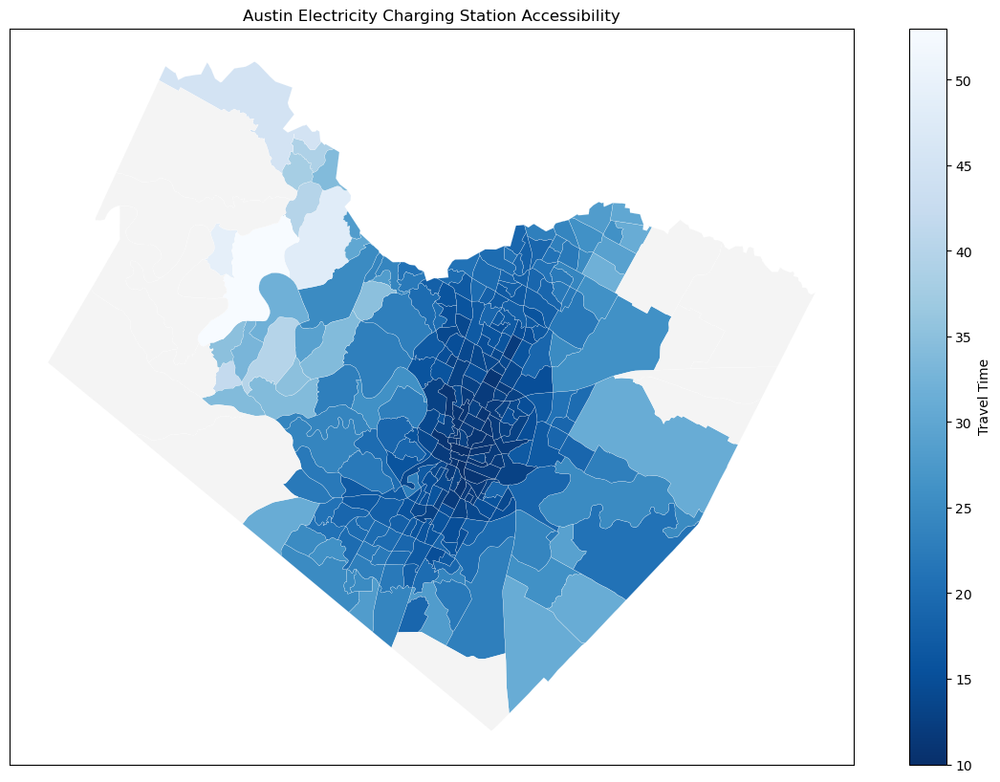

In [30]:
# Plot the accessibility map
# Plot settings
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Plotting non-zero travel times with a color map
overall_access[overall_access['travel_time'].notna()].plot(
    column='travel_time', 
    cmap='Blues_r', 
    legend=True, 
    ax=ax,
    legend_kwds={'label': "Travel Time"}
)

# Overlay zero travel times in light gray
overall_access[overall_access['travel_time'].isna()].plot(
    color='#f4f4f4', 
    ax=ax,
    label = 'travel tiem not avaliable'
)

# Adding boundaries
overall_access.boundary.plot(ax=ax, edgecolor='white', linewidth=0.1)
# Titles and labels
ax.set_title('Austin Electricity Charging Station Accessibility')

# Remove the axis for a cleaner look
ax.set_xticks([])
ax.set_yticks([])

plt.show()


### 4.3 Compare the Accessibility to ECS Across Different Demographic Features

Through the following map, I aim to examine whether there is disproportionate access to Electricity Charging Stations (ECS) for minority groups or low-income groups. 

In 2022, the median household income in Texas was 74,640 U.S dollars. The map will analyze census tracts with median household incomes above 74,640 to assess their access to ECS. It will also evaluate tracts where the median income is less than 80% of 74,640 (approximately 59,712) to compare their ECS accessibility.

Similarly, for racial demographics, the white population's proportion of the Total Census Tract population was used to calculate the average white population fraction (aWpf) across all census tracts, approximately 61.6%. The average Black population fraction, approximately 12.4%, was also computed. The map will then assess the accessibility to ECS for these tracts and compare the findings.

In [31]:
# Add White Alone Percentage and Black Alone Percentage to Census Tract geodataframe
overall_access['White Alone Percentage'] = overall_access['White Alone'] / overall_access['Total Population']
overall_access['Black Alone Percentage'] = overall_access['Black Alone'] / overall_access['Total Population']
overall_access

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,Population Density,White Alone,Black Alone,Asian Alone,Hispanic or Latino,Female,Bachelor Degree or Higher,travel_time,White Alone Percentage,Black Alone Percentage
0,48,453,002447,48453002447,24.47,Census Tract 24.47,G5020,S,4040858,0,...,2107.4440,671,136,2,2360,1259,789,18.0,0.204075,0.041363
1,48,453,040700,48453040700,407,Census Tract 407,G5020,S,1971513,0,...,9322.0560,844,339,124,5743,3815,1007,15.0,0.118940,0.047773
2,48,453,041900,48453041900,419,Census Tract 419,G5020,S,2656097,0,...,3201.2880,1702,69,288,1121,1619,2111,17.0,0.518428,0.021017
3,48,453,041100,48453041100,411,Census Tract 411,G5020,S,1439764,0,...,2813.4760,885,136,101,381,762,1156,15.0,0.565857,0.086957
4,48,453,036700,48453036700,367,Census Tract 367,G5020,S,7448619,0,...,2562.6510,4329,58,1251,1629,3433,7363,25.0,0.587381,0.007870
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,48,453,002419,48453002419,24.19,Census Tract 24.19,G5020,S,1355523,0,...,7503.2910,673,95,130,2962,2018,1015,19.0,0.171378,0.024191
286,48,453,002422,48453002422,24.22,Census Tract 24.22,G5020,S,4031630,0,...,5229.9170,3589,396,357,3530,3799,3673,17.0,0.440855,0.048643
287,48,453,002423,48453002423,24.23,Census Tract 24.23,G5020,S,2621119,0,...,6186.6380,3199,214,187,2451,3152,3533,20.0,0.510941,0.034180
288,48,453,002424,48453002424,24.24,Census Tract 24.24,G5020,S,2764930,0,...,3323.5120,1892,115,100,1297,1853,1572,19.0,0.533258,0.032413


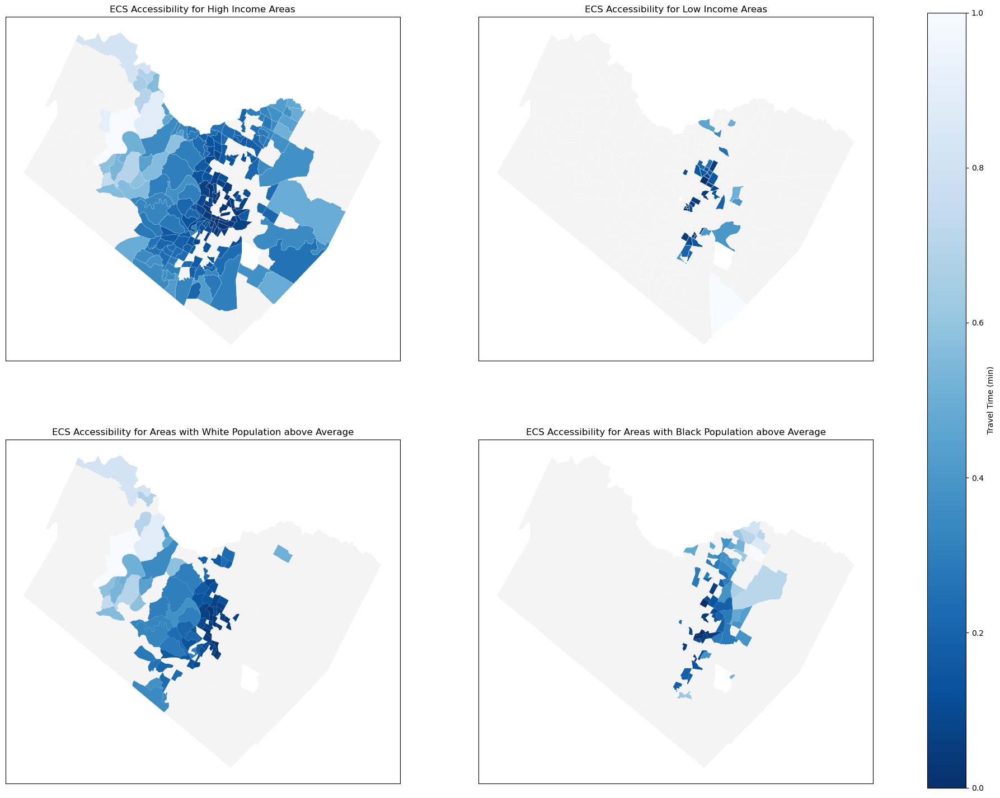

In [32]:
#Plot the 2 by 2
fig, axs = plt.subplots(2, 2, figsize=(25, 18))

# Plot for census tracts with median household incomes above $74,640
overall_access.loc[(overall_access['travel_time'].notna()) & (overall_access['Median Household Income'] >= 74640)].plot(
    column='travel_time', 
    cmap='Blues_r', 
    legend=False, 
    ax=axs[0, 0]
)

# Overlay zero travel times in light gray
overall_access.loc[(overall_access['travel_time'].isna()) | (overall_access['Median Household Income'] < 74640)].plot(
    color='#f4f4f4', 
    ax=axs[0, 0]
)

# Adding boundaries
overall_access.boundary.plot(ax=axs[0, 0], edgecolor='white', linewidth=0.1)

# Titles and labels
axs[0, 0].set_title('ECS Accessibility for High Income Areas')
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])


# Plot for census tracts with median household incomes below 80% of $74,640
overall_access.loc[(overall_access['travel_time'].notna()) & (overall_access['Median Household Income'] <= 59712)].plot(
    column='travel_time', 
    cmap='Blues_r', 
    legend=False, 
    ax=axs[0, 1]
)

# Overlay zero travel times in light gray
overall_access.loc[(overall_access['travel_time'].isna())|(overall_access['Median Household Income'] > 59712)].plot(
    color='#f4f4f4', 
    ax=axs[0, 1]
)

# Adding boundaries
overall_access.boundary.plot(ax=axs[0, 1], edgecolor='white', linewidth=0.1)

# Titles and labels
axs[0, 1].set_title('ECS Accessibility for Low Income Areas')
axs[0, 1].set_xticks([])
axs[0, 1].set_yticks([])



# Plot for census tracts with white population more than aWpf
overall_access.loc[(overall_access['travel_time'].notna()) & (overall_access['White Alone Percentage'] >= 0.616)].plot(
    column='travel_time', 
    cmap='Blues_r', 
    legend=False, 
    ax=axs[1, 0]
)

# Overlay zero travel times in light gray
overall_access.loc[(overall_access['travel_time'].isna()) | (overall_access['White Alone Percentage'] < 0.616)].plot(
    color='#f4f4f4', 
    ax=axs[1, 0]
)

# Adding boundaries
overall_access.boundary.plot(ax=axs[0, 1], edgecolor='white', linewidth=0.1)

# Titles and labels
axs[1, 0].set_title('ECS Accessibility for Areas with White Population above Average')
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])



# Plot for census tracts with black population more than aBpf
overall_access.loc[(overall_access['travel_time'].notna()) & (overall_access['Black Alone Percentage'] >= 0.124)].plot(
    column='travel_time', 
    cmap='Blues_r', 
    legend=False, 
    ax=axs[1, 1]
)

# Overlay zero travel times in light gray
overall_access.loc[(overall_access['travel_time'].isna()) | (overall_access['Black Alone Percentage'] < 0.124)].plot(
    color='#f4f4f4', 
    ax=axs[1, 1]
)

# Adding boundaries
overall_access.boundary.plot(ax=axs[0, 1], edgecolor='white', linewidth=0.1)

# Titles and labels
axs[1, 1].set_title('ECS Accessibility for Areas with Black Population above Average')
axs[1, 1].set_xticks([])
axs[1, 1].set_yticks([])

fig.colorbar(plt.cm.ScalarMappable(cmap='Blues_r'), ax=axs, orientation='vertical', label='Travel Time (min)')

#### Key Takeaway:
Overall, the highest Electricity Charging Station Accessibility Index is centered around downtown Austin and the west side of I-35.
a. There is a concentration of high ECS Accessibility Index in tracts with a white population exceeding the average white population fraction (aWpf). For census tracts with a Black population greater than the average Black population fraction (aBpf), the ECS Accessibility Index is relatively uniform.

b. Tracts with a Median Household Income higher than the average (74,640), especially on the west side of I-35, show higher concentrations of Low ECS Accessibility Index. Conversely, tracts with a Median Household Income below 59,712 display a little bit lower ECS Accessibility Index concentrations, particularly on the east side of I-35.

### 4.4 Regression Analysis

In [33]:
y = overall_access['travel_time']  # Dependent variable
X = overall_access[['Population Density', 'White Alone', 'Black Alone', 'Asian Alone', 'Hispanic or Latino', 
                    'Female', 'Bachelor Degree or Higher','Median Household Income']]  # Independent variables
# Check for any missing values and fill or drop them
X = X.fillna(X.mean())  
y = y.fillna(y.mean())  
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Add a constant to the predictor variable set to include the intercept in the model
X_train_sm = sm.add_constant(X_train)

# Fit the model using statsmodels
logit_model = sm.OLS(y_train, X_train_sm)
result = logit_model.fit()

# Print the summary of the logistic regression model
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:            travel_time   R-squared:                       0.407
Model:                            OLS   Adj. R-squared:                  0.384
Method:                 Least Squares   F-statistic:                     17.85
Date:                Wed, 01 May 2024   Prob (F-statistic):           3.48e-20
Time:                        12:45:09   Log-Likelihood:                -682.23
No. Observations:                 217   AIC:                             1382.
Df Residuals:                     208   BIC:                             1413.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

The R square indicates that approximately 40.7% of the variance in travel_time can be explained by the independent variables included in the model. Soefficient indicates that census tracts with higher population density correlates with reduced travel times, suggesting more efficient accessibility to ECS in denser areas. Census tracts with larger percentages of White and Asian populations experience longer travel times, likely due to urban planning disparities. Higher education levels are associated with shorter travel times, indicating better access to ECS. Interestingly, higher household incomes correlate with longer travel times, possibly reflecting longer commutes from suburban areas. 

### Conclusion
Thank you! Dr. Larson and Juan, for a fantastic semester! I really enjoyed the coding sessions and learned a lot.